# Online DA: HadCRUT obs assimilated 
Katie Brennan  
Februrary 16, 2022  

In [67]:
import sys
import numpy as np
import xarray as xr
import datetime

import matplotlib.pyplot as plt
import matplotlib.path as mpath
import cartopy.crs as ccrs

import pickle 

from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,AutoMinorLocator)

In [2]:
sys.path.append("../../")
import Online_DA_utils as oda

In [3]:
sys.path.append("/home/disk/p/mkb22/Documents/si_analysis_kb/LIMs/SI_LIMs/")

import LIM_utils_kb as limkb
import LIM_stats_kb as statskb
# import LIM_plot_kb as plotkb
import LIM_building as limbuild

In [59]:
def load_annual_walsh(version=None):
    """
    Loads annualized total Arctic extent and area from Walsh et al version 1 or 2. 
    
    INPUTS: 
    version: integer value indicating the value of Walsh data to load (takes values: 1,2,None)
    
    OUTPUTS: 
    walsh_sia: total arctic sea ice area (km^2)
    walsh_sie: total arctic sea ice extent (km^2)
    walsh_time: years of walsh data (years)
    """
    walsh_directory = '/home/disk/chaos/mkb22/Documents/SeaIceData/Walsh2016/walsh_comparison/'
    
    if version is None: 
        vera = 2
        vere = 2
    elif version == 3: 
        vera = 2
        vere = 3
    else: 
        vera = version
        vere = version

    walsh_sie_file_an = 'Walsh_annual_sie_km2_v'+str(vere)+'.npz'
    walsh_sia_file_an = 'Walsh_annual_sia_km2_v'+str(vera)+'.npz'

    walsh_sie_data_an = np.load(walsh_directory + walsh_sie_file_an)
    walsh_sia_data_an = np.load(walsh_directory + walsh_sia_file_an)
    
    walsh_time = walsh_sie_data_an['years']
    
    if version ==2: 
        walsh_sia = walsh_sia_data_an['walsh_nh_annual_area_total']/1e6
        walsh_sie = walsh_sie_data_an['walsh_nh_annual_extent_total']/1e6
    elif version ==3:     
        walsh_sia = walsh_sia_data_an['walsh_nh_annual_area_total']/1e6
        walsh_sie = walsh_sie_data_an['walsh_nh_annual_extent_total_amn_first']/1e6
    else: 
        walsh_sia = walsh_sia_data_an['walsh_nh_annual_area_total']
        walsh_sie = walsh_sie_data_an['walsh_nh_annual_extent_total']
    
#     if ver == 1: 
#         walsh_time = np.arange(1850,2014,1)
#     else: 
#         walsh_time = np.arange(1850,2018,1)
    
    return walsh_sia, walsh_sie, walsh_time

In [60]:
def find_anomalies(TIME, VAR, ANOM_START, ANOM_END, mean=False):
    """Finds anomalies between (and including) ANOM_START and ANOM_END. 
       inputs: 
       TIME = array of years (time) 
       VAR = variable to take anomalies of (time)
       ANOM_START = year anomaly period starts
       ANOM_END = year anomaly period ends (included) 
    """
   
    gt = np.where(TIME>=ANOM_START)
    lt = np.where(TIME<=ANOM_END)
    
    VAR_mean = np.nanmean(VAR[gt[0].min():lt[0].max()],axis=0)
    VAR_anom = VAR - VAR_mean
    
    if mean is True: 
        return VAR_anom, VAR_mean
    else: 
        return VAR_anom

In [4]:
import importlib
importlib.reload(oda)
importlib.reload(limkb)

<module 'LIM_utils_kb' from '/home/disk/p/mkb22/Documents/si_analysis_kb/LIMs/SI_LIMs/LIM_utils_kb.py'>

In [5]:
plt.rcParams['figure.dpi']=300

In [6]:
limvars = ['tas','tos','psl','zg','sit','sic']

In [71]:
niters = 1
it_list = np.arange(1,niters+1,1)

## Load experiment: 

In [72]:
#limname = 'multimod_CESM1_MPI_GFDL_HadGEM3_CanESM_Amon'
#limname = 'multimod_MPI_GFDL_HadGEM3_CanESM_Amon'
limname = 'cesm_lme_Amon'

LIM = oda.load_L(limname)
LIMd = LIM['LIMd']
LIMd.keys()

Loading: /home/disk/kalman2/mkb22/SI_LIMs/sensitivity_testing/master/LIMcast_cesm_lme_Amon_ntrain_850_1650_cesm_lme_Amon_validy_1651_1850_tas50L0.1_psl50L0.1_zg50L0.1_tos50L0.1_sit50L40_sic50L40_20211202_sqrtWt.pkl


dict_keys(['vec', 'veci', 'val', 'lam_L', 'C_0', 'C_1', 'Gt', 'lam_L_adj', 'npos_eigenvalues', 'E3', 'W_all', 'standard_factor', 'E3_all', 'E_sic', 'var_dict', 'P_train', 'exp_setup', 'frac_neg_eigenvals'])

In [73]:
nyears = 170
#nyears = 155

# Generate times: 
t_total = nyears*12
years = int(1851+np.floor((t_total-1)/12))
time = np.array([datetime.datetime(y, m, 15) for y in np.arange(1851,1851+nyears,1) for m in np.arange(1,13,1)])

In [129]:
output_dir = '/home/disk/kalman2/mkb22/Online_DA/experiments/hadcrut/nobs50/'
data_all = {}
Xa_dcomp_all = {}
#Xa_dcomp = np.zeros((niters,LIMd['E3_all'].shape[0]+LIMd['E_sic'].shape[0],data['Xa'].shape[0]))
nmodes = LIMd['E3_all'].shape[1]

for i,it in enumerate(it_list): 
#     filename = ('ODA_prior_cesm_lme_Amon_LIM_cesm_lme_Amon_obs_hadCRUT_all_rand50_t_0_2040'+
#                 '_nomj_trainR_it'+str(it)+'.pkl')
#     filename = ('ODA_prior_cesm_lme_Amon_LIM_cesm_lme_Amon_obs_hadCRUT_all_rand50_t_0_2040_nomj_'+
#                 'trainRe_div10_fixedcov_it'+str(it)+'.pkl')
    filename = ('ODA_prior_cesm_lme_Amon_LIM_cesm_lme_Amon_obs_hadCRUT_all_rand50_t_0_2040_nomj_'+
                'trainRe_div10_it'+str(it)+'.pkl')
#     filename = ('ODA_prior_cesm_lme_Amon_LIM_cesm_lme_Amon_obs_cmip6_mpi_hist_regridlme_Amon_'+
#                 'rand50_t_0_1860_nomj_trainRe_it'+str(it)+'_test.pkl')

    data_all[it] = pickle.load(open(output_dir+filename,"rb"))
    
    if i is 0: 
        Xa_dcomp = np.zeros((niters,LIMd['E3_all'].shape[0]+LIMd['E_sic'].shape[0],data_all[it]['Xa'].shape[0]))

    Xa_dcomp[i,:,:] = limkb.decompress_eof_separate_sic(data_all[it]['Xa'].T,nmodes,LIMd['exp_setup']['nmodes_sic'],
                                                         LIMd['E3_all'],LIMd['E_sic'],LIMd['exp_setup']['limvars'],
                                                         LIMd['var_dict'],LIMd['W_all'],Weights=LIMd['exp_setup']['Weight'],
                                                         sic_separate=LIMd['exp_setup']['sic_separate'])

In [130]:
for var in limvars: 
    Xa_dcomp_var = np.zeros((niters, LIMd['var_dict'][var]['var_ndof'],data_all[1]['Xa'].shape[0]))
    for i,it in enumerate(it_list):
        Xa_dcomp_var[i,:,:] = Xa_dcomp[i,LIMd['var_dict'][var]['var_inds'],:]

    Xa_dcomp_all[var] = Xa_dcomp_var

In [131]:
obs_mean = np.zeros((t_total))

for t in range(t_total):
    obs_mean[t] = np.nanmean(data_all[1]['obs_assimilated'][t]['obs'])

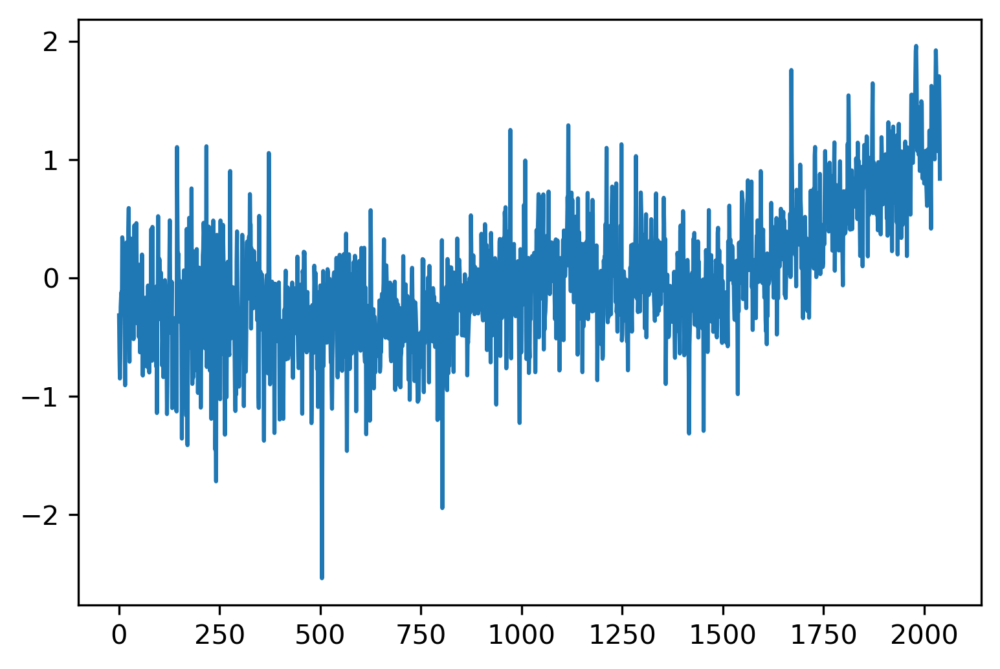

In [132]:
plt.plot(obs_mean)

In [133]:
fig = plt.figure(figsize=(8,5))

plt.plot(time, data_all[1]['HPbHT_trace'], color='lightseagreen',label='Trace(HPbHT)')
plt.plot(time, data_all[1]['R_trace'], color='orange',label='Trace(Re)')

# plt.axhline(np.trace(cov_d_100),linestyle='--', color='gray',label='Trace(Cov(d,d))')
# plt.axhline(np.trace(cov_d_400),linestyle='--', color='b',label='Trace(Cov(d,d))')
# plt.axhline(np.trace(cov_d),linestyle='--', color='k',label='Trace(Cov(d,d))')

plt.ylabel('Trace of covariance', fontsize=14)
plt.title('', fontsize=16)
plt.grid()
plt.legend(fontsize=14)

KeyError: 'HPbHT_trace'

<Figure size 2400x1500 with 0 Axes>

(0, 30)

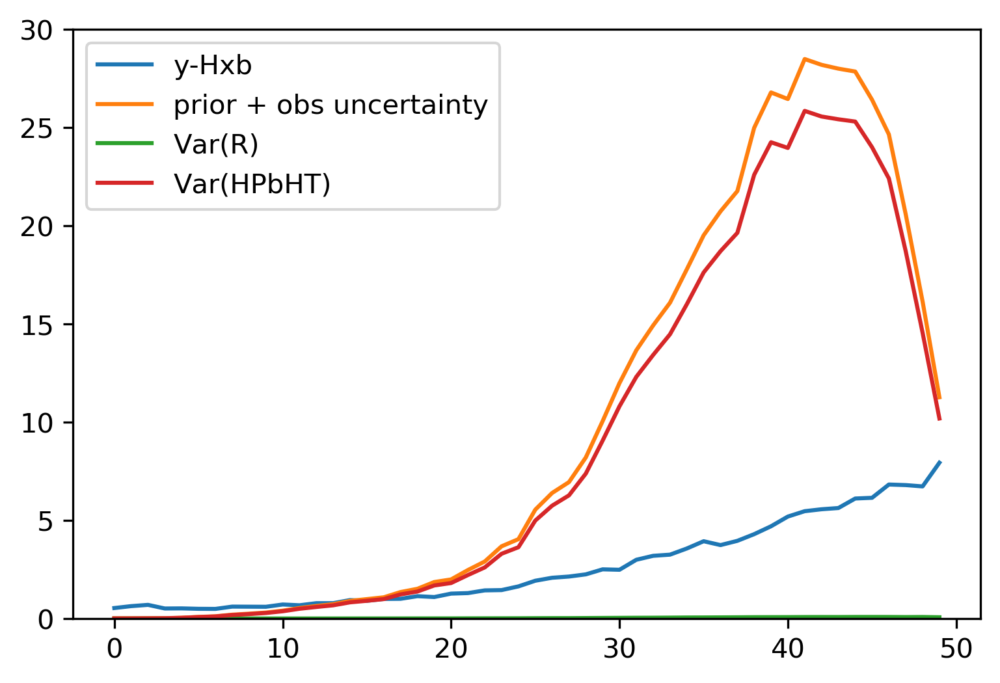

In [134]:
diag_K_den = np.zeros((t_total,50))
for t in range(t_total):
    diag_K_den[t,:] = np.diagonal(data_all[1]['K_den'][t,:,:])

plt.plot(np.var(data_all[1]['diff'],axis=1), label='y-Hxb')
plt.plot(np.var(diag_K_den,axis=0), label='prior + obs uncertainty')
plt.plot(np.var(data_all[1]['R_intime'],axis=0), label='Var(R)')
plt.plot(np.var(data_all[1]['HPbHT_intime'],axis=0), label='Var(HPbHT)')
plt.legend()
plt.ylim(0,30)

In [135]:
cov_d = np.matmul(data_all[1]['diff'],data_all[1]['diff'].T)/(data_all[1]['diff'].shape[1]-1)
Kden_diag = np.diagonal(np.nanmean(data_all[1]['K_den'],axis=0))

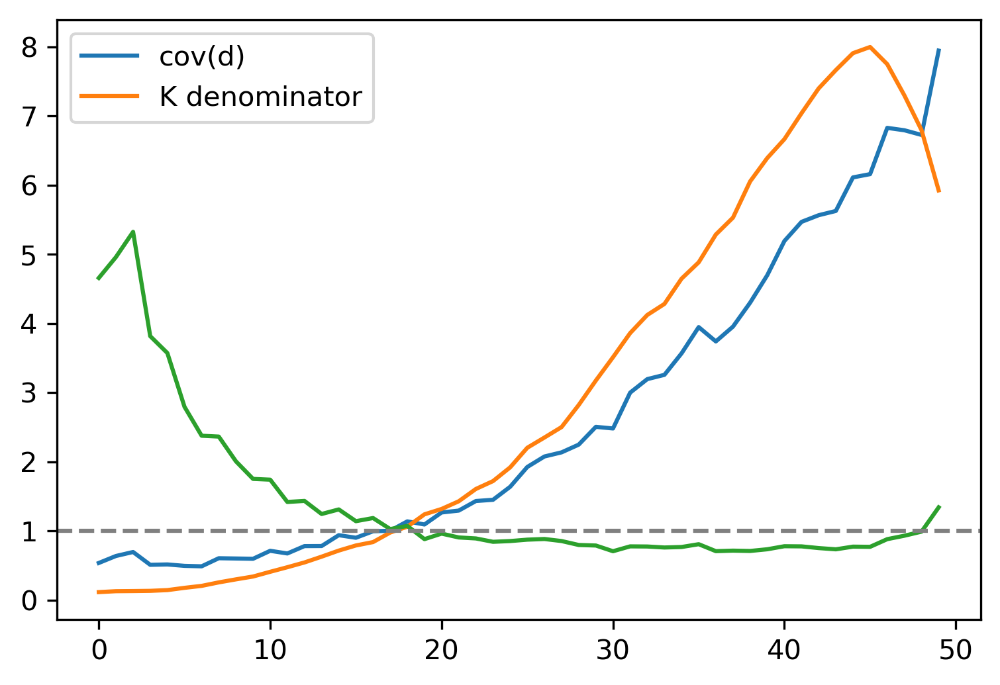

In [136]:
plt.plot(np.diagonal(cov_d),label='cov(d)')
plt.plot(Kden_diag, label='K denominator')
plt.plot(np.diagonal(cov_d)/Kden_diag)
plt.axhline(1,linestyle='--',color='gray')
plt.legend()

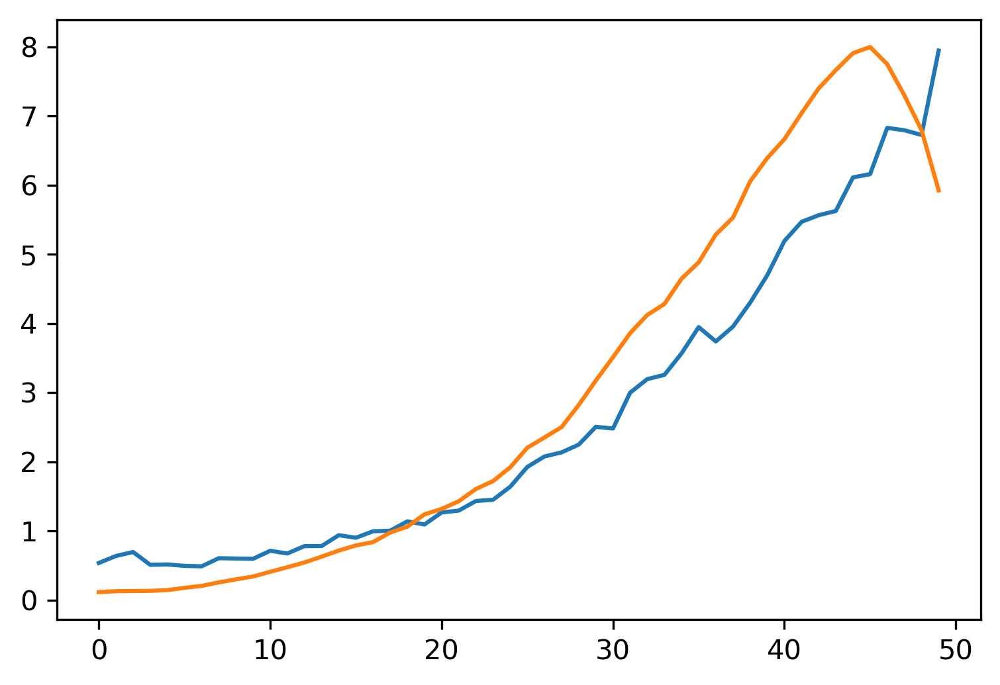

In [137]:
plt.plot(np.diagonal(cov_d))
plt.plot(Kden_diag)

In [138]:
Kden_diag = np.diagonal(np.nanmean(data_all[1]['K_den'],axis=0))

In [139]:
Pb_trace_all = np.zeros((niters,data_all[1]['Pb_trace'].shape[0]))
ratio_mean_all = np.zeros((niters,data_all[1]['ratio_mean_100'].shape[0]))
ratio_median_all = np.zeros((niters,data_all[1]['ratio_median_100'].shape[0]))

for i,it in enumerate(it_list): 
    Pb_trace_all[i,:] = data_all[it]['Pb_trace']
    ratio_mean_all[i,:] = data_all[it]['ratio_mean_100']
    ratio_median_all[i,:] = data_all[it]['ratio_median_100']

In [140]:
ratio_mean_97_5 = np.percentile(ratio_mean_all,97.5,axis=0)
ratio_mean_2_5 = np.percentile(ratio_mean_all,2.5,axis=0)

ratio_median_97_5 = np.percentile(ratio_median_all,97.5,axis=0)
ratio_median_2_5 = np.percentile(ratio_median_all,2.5,axis=0)

Text(0, 0.5, '$cov(d,d)/[HP_bH^{T}+R]$')

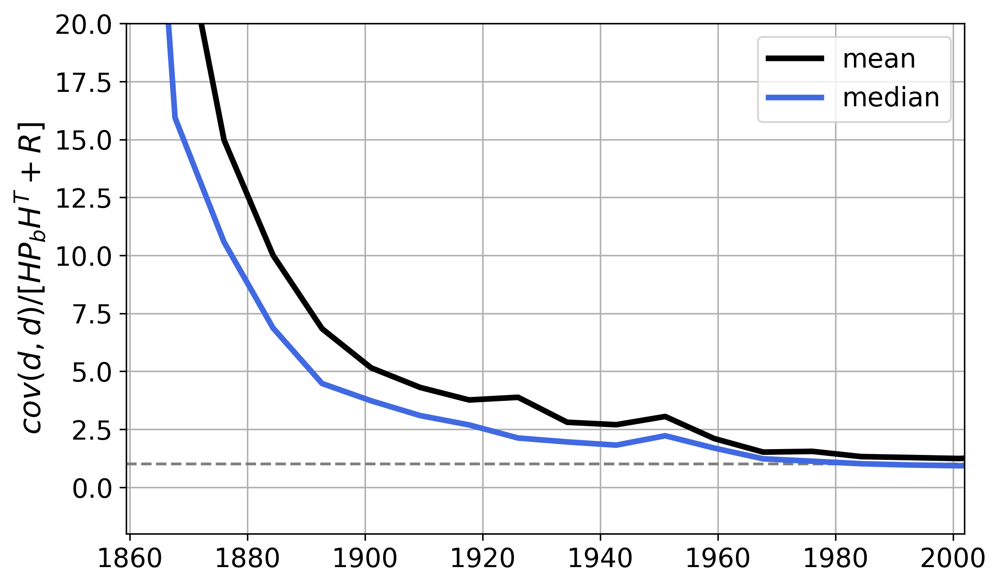

In [184]:
fig, ax = plt.subplots(figsize=(8, 5))
# plt.plot(time[0:10],np.zeros(10),color='gray',linestyle='--',label='control-R',linewidth=3)
# plt.plot(time[0:10],np.zeros(10),color='gray',linestyle='-',label='regression-R',linewidth=3)
plt.axhline(1,color='gray',linestyle='--')

plt.plot(time[100::100],np.mean(ratio_mean_all,axis=0), color='k', linewidth=3, label='mean')
plt.plot(time[100::100],np.mean(ratio_median_all,axis=0),color='royalblue', linewidth=3, label='median')

plt.fill_between(time[100::100],ratio_mean_2_5,ratio_mean_97_5, color='k', alpha=0.2)
plt.fill_between(time[100::100],ratio_median_2_5,ratio_median_97_5,color='royalblue', alpha=0.5)

plt.grid()
plt.xlim(time[100],time[1810])
plt.ylim(-2,20)
plt.legend(fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel('$cov(d,d)/[HP_bH^{T}+R]$', fontsize=16)

In [142]:
np.mean(np.mean(ratio_mean_all,axis=0)), np.median(np.median(ratio_mean_all,axis=0))

(8.277705764698386, 2.9295982396760145)

In [143]:
np.mean(np.mean(ratio_mean_all,axis=0)), np.median(np.median(ratio_mean_all,axis=0))

(8.277705764698386, 2.9295982396760145)

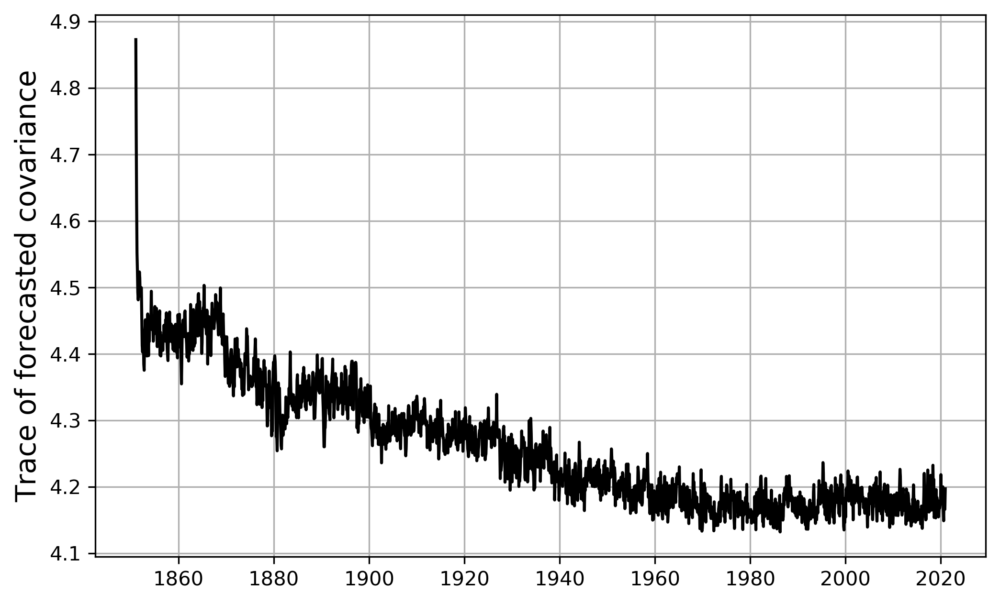

In [144]:
fig, ax = plt.subplots(figsize=(8, 5))

plt.plot(time, np.mean(Pb_trace_all,axis=0), color='k')
plt.fill_between(time, np.percentile(Pb_trace_all,2.5,axis=0),
                 np.percentile(Pb_trace_all,97.5,axis=0),color='k',alpha=0.2)

plt.ylabel('Trace of forecasted covariance', fontsize=14)
plt.title('', fontsize=16)
plt.grid()
#plt.xlim(time[0],time[-1])
#plt.ylim(4.8, 5.65)

### Load temperature products: 

In [26]:
GIS_tas, GIS_lat, GIS_lon, GIS_time = oda.load_GISTEMP()
GIS_nhmean = oda.global_mean_noarea(GIS_tas[:,45:,:], GIS_lat[45:])

In [27]:
BE_tas, BE_lat, BE_lon, BE_time = oda.load_BerkeleyEarth()
BE_nhmean = oda.global_mean_noarea(BE_tas[:,90:,:], BE_lat[90:])

In [28]:
HadCRUT_tas, HadCRUT_lat, HadCRUT_lon, HadCRUT_time = oda.load_HadCRUT5()
Had_nhmean = oda.global_mean_noarea(HadCRUT_tas[:,18:,:], HadCRUT_lat[18:])

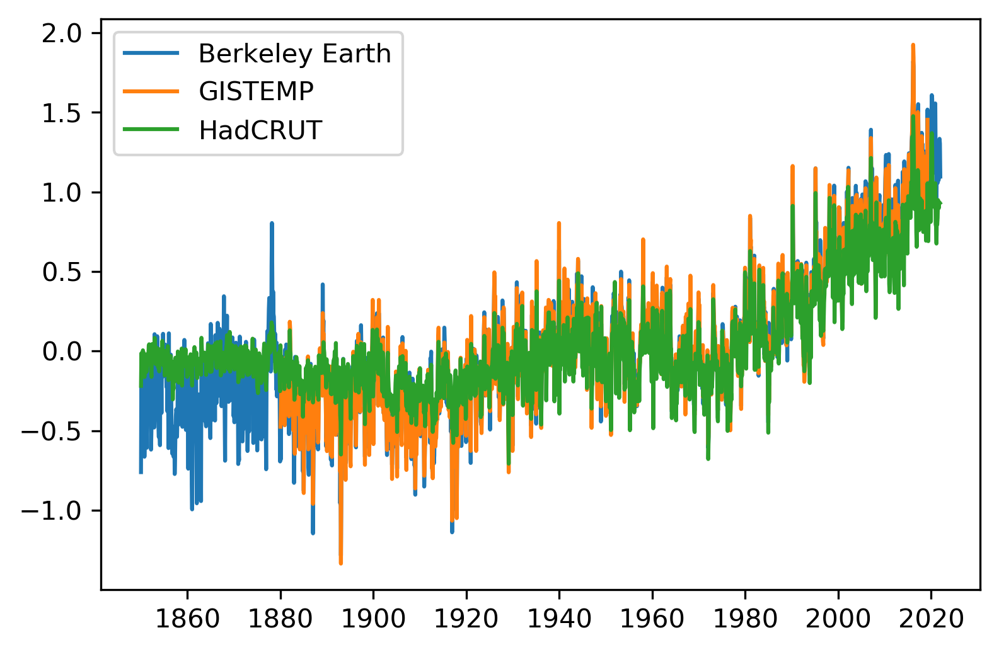

In [29]:
plt.plot(BE_time,BE_nhmean, label='Berkeley Earth')
plt.plot(GIS_time,GIS_nhmean, label='GISTEMP')
plt.plot(HadCRUT_time,Had_nhmean, label='HadCRUT')
plt.legend()

## Full field: pan-Arctic skill

In [145]:
valid_dsource = 'cesm_lme_Amon'
fdic_valid = limkb.build_training_dic(valid_dsource)

In [146]:
full_names, areawt_name, month_names = limbuild.load_full_names(valid_dsource)

areacell_dict_all = {}
areacell = {}
for var in limvars:
    areacell_dict = {}
    areacell[var], areacell_dict_all[var] = limkb.load_data(areawt_name[var], areacell_dict, fdic_valid, 
                                                            remove_climo=False, detrend=False, verbose=False, 
                                                            lat_cutoff=LIMd['exp_setup']['lat_cutoff'][var])

Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 0.1
Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 0.1
Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 0.1
Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 0.1
Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 40
Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 40


In [147]:
tot_var_forecast_all = {}
var_dict = LIMd['var_dict']

for var in limvars: 
    tot_var_forecast = np.zeros((niters,t_total))
    
    print('Working on '+var)
    units = areacell_dict_all[var][areawt_name[var]]['units']

    if 'km' in units:
        acell = areacell[var]
    elif 'centi' in units: 
        print('changing cellarea units from '+
              str(areacell_dict_all[var][areawt_name[var]]['units'])+' to km^2')
        acell = areacell[var]*(1e-10)
        units = 'km^2'
    else: 
        print('changing cellarea units from '+
              str(areacell_dict_all[var][areawt_name[var]]['units'])+' to km^2')
        acell = areacell[var]*(1e-6)
        units = 'km^2'
    
    for i,it in enumerate(it_list):
        if var == 'sic':
            nlon = int(var_dict[var]['var_ndof']/var_dict[var]['lat'].shape[0])
            tot_var_forecast[i,:] = oda.calc_tot_si_checks(Xa_dcomp_all[var][i,:,:],acell,units,
                                                           var_dict[var]['lat'],nlon,lat_cutoff=0.0)
        else: 
            tot_var_forecast[i,:] = oda.global_mean(Xa_dcomp_all[var][i,:,:],acell)
            
    tot_var_forecast_all[var] = tot_var_forecast

Working on tas
changing cellarea units from m^2 to km^2
Working on tos
changing cellarea units from m^2 to km^2
Working on psl
changing cellarea units from m^2 to km^2
Working on zg
changing cellarea units from m^2 to km^2
Working on sit
changing cellarea units from m^2 to km^2
Working on sic
changing cellarea units from m^2 to km^2


In [148]:
full_names = {'tas':'Surface air temperature ($^\circ$C)', 
              'tos':'Sea surface temperature ($^\circ$C)',
              'psl':'Sea level pressure (Pa)',
              'zg': '500 hPa Geopotential Height (m)',
              'sit': 'Sea ice thickness (m)',
              'sic': 'Sea ice area (10$^6$ km$^2$)'}

var_units = {'tas':'$^\circ$C', 
              'tos':'$^\circ$C',
              'psl':'Sea level pressure',
              'zg': 'm',
              'sit': 'm',
              'sic': '10$^6$ km$^2$'}

Text(0, 0.5, 'Northern hemisphere mean')

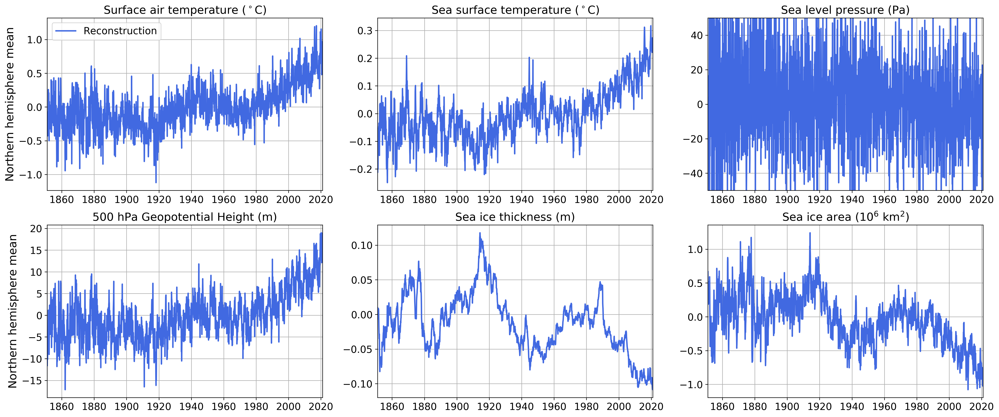

In [149]:
fig,axs = plt.subplots(2,3, figsize=(24,10))
ax = axs.flatten()

#ax[0].plot(GIS_time,GIS_nhmean, color='k',label='GISTEMP')

for i,var in enumerate(limvars):
    if 'sic' in var: 
        forecast = tot_var_forecast_all[var]*1e-6
    else: 
        forecast = tot_var_forecast_all[var]
    
    ax[i].plot(time, np.mean(forecast,axis=0), label='Reconstruction', color='royalblue',linewidth=2)
    ax[i].fill_between(time, np.percentile(forecast,2.5,axis=0), np.percentile(forecast,97.5,axis=0),
                       alpha=0.5, color='royalblue', linewidth=0.0)


    ax[i].set_title(full_names[var], fontsize=16)
    ax[i].grid()
    ax[i].set_xlim(time[0],time[-1])
#     ax[i].set_ylabel(var_units[var], fontsize=16)
    ax[i].tick_params(axis='both', which='major', labelsize=14)
    if 'psl' in var:
        ax[i].set_ylim(-50,50)

ax[0].legend(fontsize=14)
ax[0].set_ylabel('Northern hemisphere mean', fontsize=16)
ax[3].set_ylabel('Northern hemisphere mean', fontsize=16)

# savename ='figures/allvar_recon_LIMmultimod_Had50obs_inf2_20it_obs_sample_spread.png'
# plt.savefig(savename)

In [150]:
savename = ('ODA_prior_CESMLME_Hadcrut_Rdiv10_20it_nhmeans.pkl')
saveloc = '/home/disk/kalman2/mkb22/Online_DA/experiments/hadcrut/nobs50/'

print('Saving output here: '+saveloc+savename)
pickle.dump(tot_var_forecast_all, open(saveloc+savename, "wb" ) )

Saving output here: /home/disk/kalman2/mkb22/Online_DA/experiments/hadcrut/nobs50/ODA_prior_CESMLME_Hadcrut_Rdiv10_20it_nhmeans.pkl


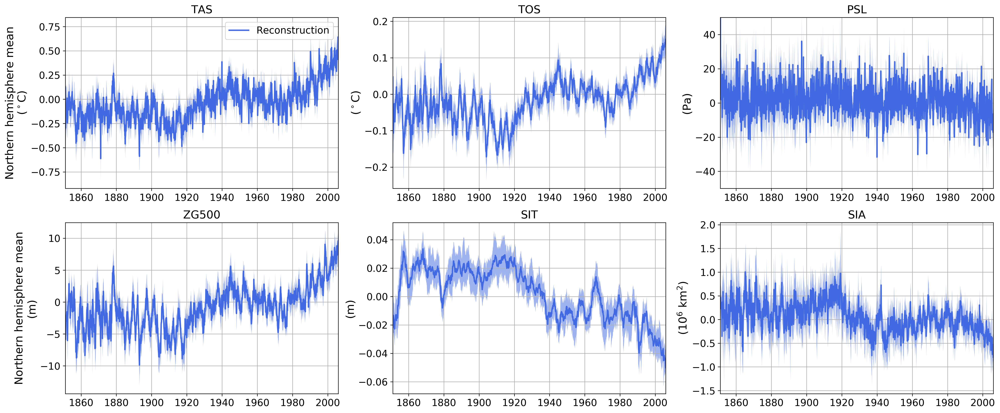

In [633]:
fig,axs = plt.subplots(2,3, figsize=(24,10))
ax = axs.flatten()

#ax[0].plot(GIS_time,GIS_nhmean, color='k',label='GISTEMP')

for i,var in enumerate(limvars):
    if 'sic' in var: 
        forecast = tot_var_forecast_all[var]*1e-6
    else: 
        forecast = tot_var_forecast_all[var]
    
    ax[i].plot(time, np.mean(forecast,axis=0), label='Reconstruction', color='royalblue',linewidth=2)
    ax[i].fill_between(time, np.percentile(forecast,2.5,axis=0), np.percentile(forecast,97.5,axis=0),
                       alpha=0.5, color='royalblue', linewidth=0.0)


    ax[i].set_title(titles[var], fontsize=16)
    ax[i].grid()
    ax[i].set_xlim(time[0],time[-1])
    ax[i].set_ylabel(units_plot[var], fontsize=16)
    ax[i].tick_params(axis='both', which='major', labelsize=14)
    if 'psl' in var:
        ax[i].set_ylim(-50,50)

ax[0].legend(fontsize=14)
ax[0].set_ylabel('Northern hemisphere mean\n'+units_plot['tas'], fontsize=16)
ax[3].set_ylabel('Northern hemisphere mean\n'+units_plot['zg'], fontsize=16)

savename ='figures/allvar_recon_LIMmultimod_Had50obs_inf2_20it_obs_sample_spread.png'
plt.savefig(savename)

In [151]:
import pandas as pd
GIS_time_dt = pd.to_datetime(GIS_time)
HadCRUT_time_dt = pd.to_datetime(HadCRUT_time)

In [152]:
BE_ind = np.where((BE_time<=time[-1]) & (BE_time>=time[0]))[0]

corr_recon_BE, ce_recon_BE = oda.calc_corr_ce(BE_nhmean[BE_ind],np.mean(tot_var_forecast_all['tas'],axis=0))
corr_recon_BE**2, ce_recon_BE

(0.6799975817444354, 0.660979378516576)

In [153]:
GIS_time_dt,time[-1]

(DatetimeIndex(['1880-01-15', '1880-02-15', '1880-03-15', '1880-04-15',
                '1880-05-15', '1880-06-15', '1880-07-15', '1880-08-15',
                '1880-09-15', '1880-10-15',
                ...
                '2018-06-15', '2018-07-15', '2018-08-15', '2018-09-15',
                '2018-10-15', '2018-11-15', '2018-12-15', '2019-01-15',
                '2019-02-15', '2019-03-15'],
               dtype='datetime64[ns]', length=1671, freq=None),
 datetime.datetime(2020, 12, 15, 0, 0))

In [154]:
recon_ind = np.where((time>=GIS_time_dt[0])&(time<=GIS_time_dt[-1]))[0]

corr_recon_GIS, ce_recon_GIS = oda.calc_corr_ce(GIS_nhmean,
                                                np.mean(tot_var_forecast_all['tas'],axis=0)[recon_ind])
corr_recon_GIS**2, ce_recon_GIS

(0.7051068821434473, 0.6786838086696099)

In [155]:
Had_ind = np.where((HadCRUT_time_dt<=time[-1]) & (HadCRUT_time_dt>=time[0]))[0]

corr_recon_Had, ce_recon_Had = oda.calc_corr_ce(Had_nhmean[Had_ind],
                                                np.mean(tot_var_forecast_all['tas'],axis=0)[:-1])
corr_recon_Had**2, ce_recon_Had

(0.6445959685294675, 0.593852619843995)

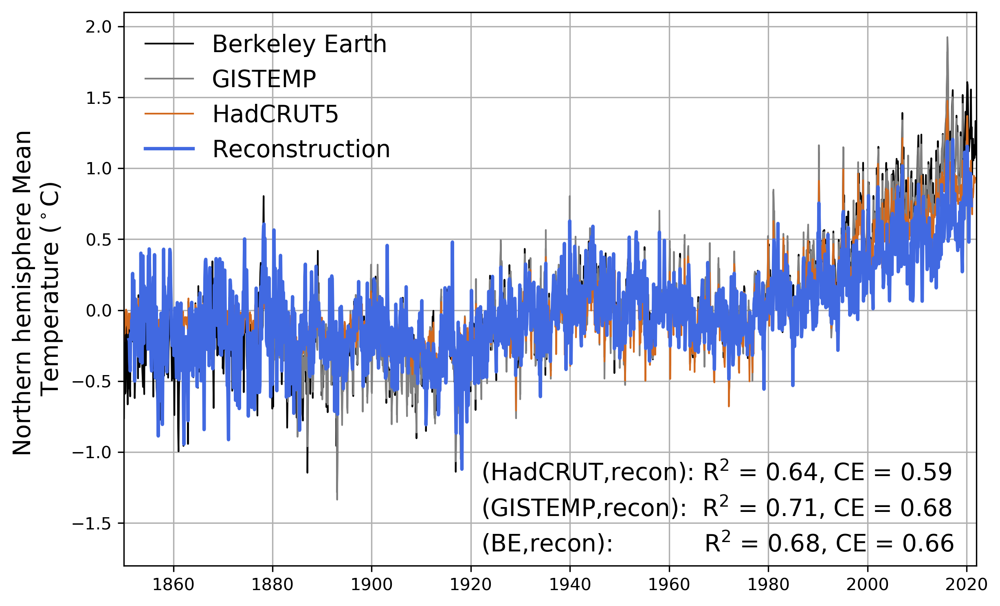

In [156]:
fig,ax = plt.subplots(1,1, figsize=(9,6))

ax.plot(BE_time,BE_nhmean, color='k',label='Berkeley Earth', linewidth=1)
ax.plot(GIS_time,GIS_nhmean, color='gray',label='GISTEMP', linewidth=1)
ax.plot(HadCRUT_time,Had_nhmean, color='chocolate',label='HadCRUT5',linewidth=1)

ax.plot(time, np.mean(tot_var_forecast_all['tas'],axis=0), 
        label='Reconstruction', color='royalblue', linewidth=2)

ax.grid()
plt.xlim(BE_time[0],BE_time[-1])
plt.ylim(-1.8,2.1)

ax.legend(fontsize=14,frameon=False, loc='upper left')
ax.set_ylabel('Northern hemisphere Mean \nTemperature ($^\circ$C)', fontsize=14)

plt.text(BE_time[-1200],-1.7,'(BE,recon):            R$^2$ = '+str(np.round(corr_recon_BE**2,2))+
         ', CE = '+str(np.round(ce_recon_BE,2)), fontsize=14)
plt.text(BE_time[-1200],-1.45,'(GISTEMP,recon):  R$^2$ = '+str(np.round(corr_recon_GIS**2,2))+
         ', CE = '+str(np.round(ce_recon_GIS,2)), fontsize=14)
plt.text(BE_time[-1200],-1.2,'(HadCRUT,recon): R$^2$ = '+str(np.round(corr_recon_Had**2,2))+
         ', CE = '+str(np.round(ce_recon_Had,2)), fontsize=14)

savename ='figures/tas_recon_LIMmultimod_Had50obs_20it_comparison_gis_be_had.png'
#plt.savefig(savename)

### Monthly performance: 

In [157]:
tas_mean_forecast = np.mean(tot_var_forecast_all['tas'], axis=0)
tas_mean_forecast_mo = np.reshape(tas_mean_forecast,(12,nyears))

In [158]:
sia_mean_forecast = np.mean(tot_var_forecast_all['sic'], axis=0)
sia_mean_forecast_mo = np.reshape(sia_mean_forecast,(nyears,12))

In [159]:
cmap = plt.cm.get_cmap('Blues')
blah = np.arange(0.4,1,0.6/6)
blue_colors = [cmap(i) for i in blah]

cmap = plt.cm.get_cmap('Reds')
blah = np.arange(0.2,1,0.8/6)
red_colors = [cmap(i) for i in blah]

In [160]:
np.arange(1851,2020,1).shape

(169,)

IndexError: list index out of range

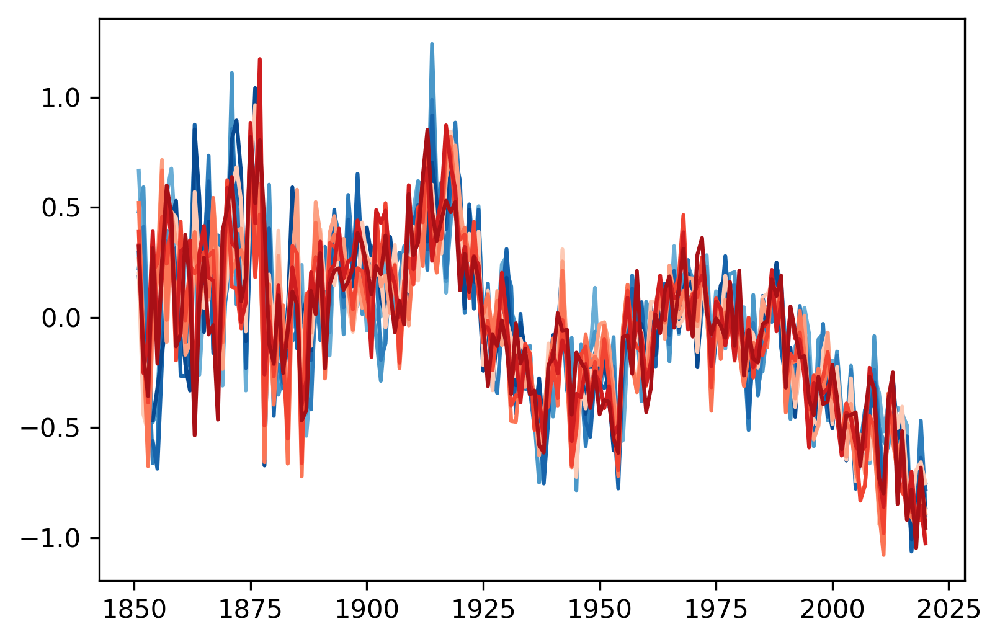

In [161]:
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sept','Oct','Nov','Dec']
c=0

for m in np.arange(0,12,1):
    if m<5:
        c=c+1
        plt.plot(np.arange(1851,2021,1),sia_mean_forecast_mo[:,m]*1e-6, label=months[m],color=blue_colors[c])
        if m==4: 
            c=0
    elif m is 11: 
        plt.plot(np.arange(1851,2021,1),sia_mean_forecast_mo[:,m]*1e-6, label=months[m],color=blue_colors[0])
    else: 
        plt.plot(np.arange(1851,2021,1),sia_mean_forecast_mo[:,m]*1e-6, label=months[m],color=red_colors[c])
        c=c+1

plt.legend(bbox_to_anchor=[1,1])
#plt.xlim(1985,2006)
#plt.ylim(-0.61,0.1)

In [ ]:
np.reshape(time,(155,12))[:,0]

ValueError: x and y must have same first dimension, but have shapes (155,) and (170,)

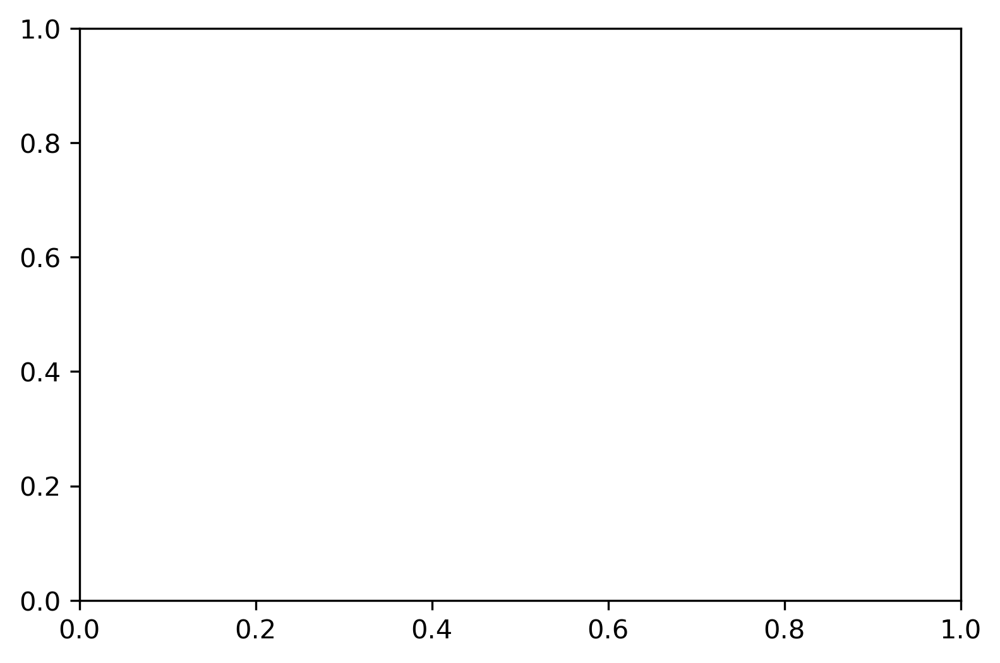

In [162]:
# plt.plot(sia_mean_forecast_mo[0,:]*1e-6, label='January')
# plt.plot(sia_mean_forecast_mo[1,:]*1e-6, label='February')
plt.plot(np.arange(1851,2006,1),sia_mean_forecast_mo[:,2]*1e-6, label='March')
# plt.plot(sia_mean_forecast_mo[3,:]*1e-6, label='April')
# plt.plot(sia_mean_forecast_mo[4,:]*1e-6, label='May')
# plt.plot(sia_mean_forecast_mo[5,:]*1e-6, label='June')
# plt.plot(sia_mean_forecast_mo[6,:]*1e-6, label='July')
# plt.plot(sia_mean_forecast_mo[7,:]*1e-6, label='August')
plt.plot(np.arange(1851,2006,1),sia_mean_forecast_mo[:,8]*1e-6, label='September')
# plt.plot(sia_mean_forecast_mo[9,:]*1e-6, label='October')
# plt.plot(sia_mean_forecast_mo[10,:]*1e-6, label='November')
# plt.plot(sia_mean_forecast_mo[11,:]*1e-6, label='December')

plt.legend(bbox_to_anchor=[1,1])

([<matplotlib.axis.YTick at 0x7f5e340ee358>,
 <a list of 12 Text yticklabel objects>)

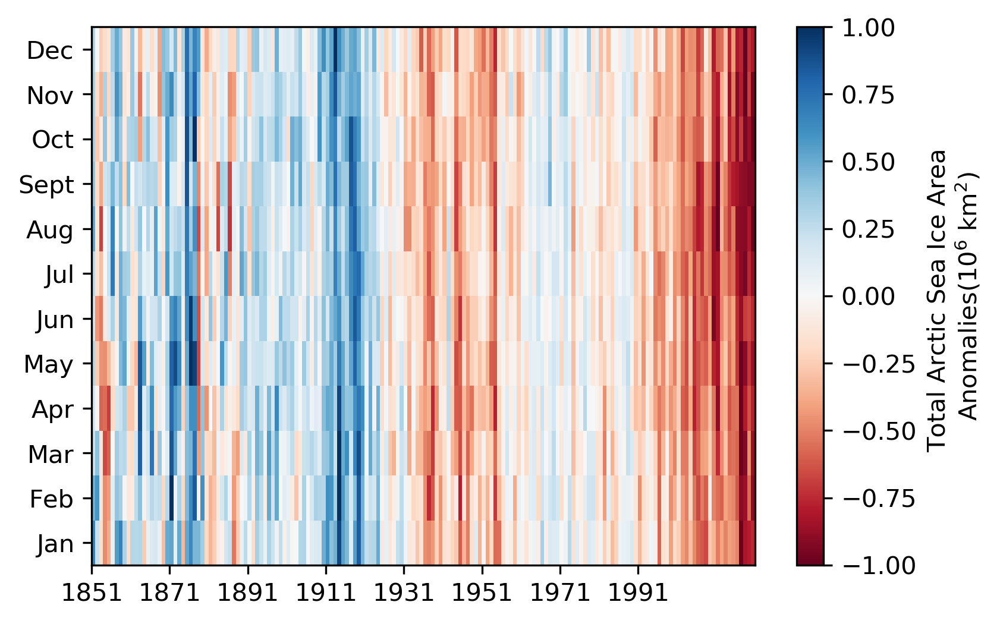

In [163]:
heat_ticks = [0,20,40,60,80,100,120,140]
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sept','Oct','Nov','Dec']

plt.pcolormesh(sia_mean_forecast_mo.T*1e-6, cmap='RdBu',vmin = -1,vmax = 1)
plt.colorbar(label='Total Arctic Sea Ice Area \nAnomalies(10$^6$ km$^2$)')

plt.xticks(heat_ticks, np.array(heat_ticks)+1851)
plt.yticks(np.arange(0.5,12,1), months)

## Satellite comparison: 

In [164]:
sat_dir = '/home/disk/chaos/mkb22/Documents/SeaIceData/Observations/Fetterer_v3/'
sat_name = 'Fetterer_data_v3_adj_monthly_78_17.npz'

satdata = np.load(sat_dir+sat_name)

In [165]:
anom_start = 1979
anom_end = 2005

In [166]:
sat_years_mo = satdata['years'][1:]
sat_sia_mo = np.reshape(satdata['si_area_adj'], (39,12))
sat_sie_mo = np.reshape(satdata['si_extent'][2:-6], (39,12))
sat_sia_mo_anom = sat_sia_mo - np.nanmean(sat_sia_mo,axis=0)

sat_sia_mo_anom_comp = sat_sia_mo[:-12,:] - np.nanmean(sat_sia_mo[:-12,:],axis=0)
sat_years_mo_comp = sat_years_mo[:-12]

In [167]:
[fet_sia_anom, fet_sia_anom_adj, fet_sie_anom, fet_time] = oda.load_annual_satellite_anom(2005)

In [168]:
recon_sia_anom_comp = sia_mean_forecast_mo[-42:-3,:] - np.nanmean(sia_mean_forecast_mo[-42:-3,:],axis=0)

In [169]:
recon_sia_ensmn = np.nanmean(sia_mean_forecast_mo,axis=1)*1e-6
recon_yrs = np.arange(1851,2021,1)

sat_ind = (recon_yrs>=anom_start)&(recon_yrs<=anom_end)
sat_ind_full = (recon_yrs>=anom_start)&(recon_yrs<=2017)

recon_sia_ensmn_anom = recon_sia_ensmn - np.nanmean(recon_sia_ensmn[sat_ind])

In [170]:
recon_sia_anom_comp = recon_sia_ensmn_anom[sat_ind_full]
recon_sia_comp_2d = sia_mean_forecast_mo[(recon_yrs>=anom_start)&(recon_yrs<=2017),:]

recon_sia_comp_anom_2d = recon_sia_comp_2d - np.nanmean(recon_sia_comp_2d,axis=0)

In [171]:
recon_sia_anom_comp = sia_mean_forecast_mo[-42:-3,:] - np.nanmean(sia_mean_forecast_mo[-42:-3,:],axis=0)

In [172]:
recon_dir = '/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/data/'
recon_file_ccsm4 = 'Brennan_and_Hakim_2021_CCSM4_model_prior_reconstructions_nh.nc'
recon_file_mpi = 'Brennan_and_Hakim_2021_MPI_model_prior_reconstructions_nh.nc'

recon_data_ccsm4 = xr.open_dataset(recon_dir+recon_file_ccsm4)
recon_data_mpi = xr.open_dataset(recon_dir+recon_file_mpi)

In [173]:
sie_ensmn_anom_ccsm4 = recon_data_ccsm4.si_extent_ensemble_mean_anomalies.values
sie_ccsm4_97_5_anom = recon_data_ccsm4.si_extent_97_5_percentiles.values
sie_ccsm4_2_5_anom = recon_data_ccsm4.si_extent_2_5_percentiles.values

sia_ensmn_anom_ccsm4 = recon_data_ccsm4.si_area_ensemble_mean_anomalies.values
sia_ccsm4_97_5_anom = recon_data_ccsm4.si_area_97_5_percentiles.values
sia_ccsm4_2_5_anom = recon_data_ccsm4.si_area_2_5_percentiles.values
recon_years = recon_data_ccsm4.time.values

In [174]:
sie_ensmn_anom_mpi = recon_data_mpi.si_extent_ensemble_mean_anomalies.values
sie_mpi_97_5_anom = recon_data_mpi.si_extent_97_5_percentiles.values
sie_mpi_2_5_anom = recon_data_mpi.si_extent_2_5_percentiles.values
recon_years_mpi = recon_data_mpi.time.values

sia_ensmn_anom_mpi = recon_data_mpi.si_area_ensemble_mean_anomalies.values
sia_mpi_97_5_anom = recon_data_mpi.si_area_97_5_percentiles.values
sia_mpi_2_5_anom = recon_data_mpi.si_area_2_5_percentiles.values
recon_years = recon_data_ccsm4.time.values

In [175]:
# LOAD ANNUAL WALSH DATA: 
[walsh_sia, walsh_sie, walsh_time] = load_annual_walsh(version=2)

walsh_sia_anom = find_anomalies(walsh_time, walsh_sia, anom_start,anom_end)
walsh_sie_anom = find_anomalies(walsh_time, walsh_sie, anom_start,anom_end)

In [176]:
[corr_sat_recon_annual, 
 ce_sat_recon_annual] = oda.calc_corr_ce(fet_sia_anom_adj,np.nanmean(recon_sia_anom_comp,axis=1)*1e-6)

In [177]:
[corr_Bren_recon_annual, 
 ce_Bren_recon_annual] = oda.calc_corr_ce(sia_ensmn_anom_ccsm4[(recon_years>=1851)],
                                          recon_sia_ensmn_anom[(recon_yrs<=1999)])

In [178]:
[corr_walsh_recon_annual, 
 ce_walsh_recon_annual] = oda.calc_corr_ce(walsh_sia_anom[1:],recon_sia_ensmn_anom[(recon_yrs<=2017)])

In [179]:
recon_sia_ensmn = np.nanmean(sia_mean_forecast_mo,axis=1)*1e-6
recon_yrs = np.arange(1851,2021,1)
sat_ind = (recon_yrs>=anom_start)&(recon_yrs<=anom_end)

recon_sia_ensmn_anom = recon_sia_ensmn - np.nanmean(recon_sia_ensmn[sat_ind])

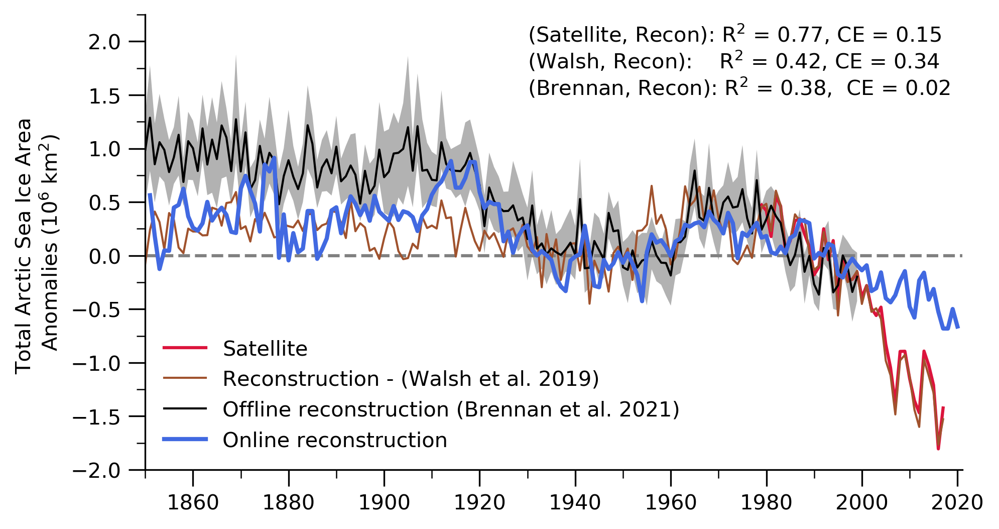

In [180]:
fig,ax = plt.subplots(1,figsize=(7,4))
plt.axhline(0,linestyle='--',color='gray')

plt.plot(fet_time,fet_sia_anom_adj, color='crimson', label='Satellite')

plt.plot(walsh_time,walsh_sia_anom,
         label='Reconstruction - (Walsh et al. 2019)', color='sienna',
         linewidth=1)
plt.plot(recon_years,sia_ensmn_anom_ccsm4,color='k',#'#8756e4',
         label='Offline reconstruction (Brennan et al. 2021)',linewidth=1)

plt.fill_between(recon_years,sia_ccsm4_2_5_anom,sia_ccsm4_97_5_anom,
                 alpha=0.3, color='k',linewidth=0.01)

plt.plot(np.arange(1851,2021,1),recon_sia_ensmn_anom, 
         color='royalblue', label='Online reconstruction', linewidth=2)

plt.legend(loc='lower left', frameon=False)
plt.ylabel('Total Arctic Sea Ice Area \nAnomalies (10$^6$ km$^2$)')

plt.text(1930,2.0,('(Satellite, Recon): R$^2$ = '+str(np.round(corr_sat_recon_annual**2,2))+
         ', CE = '+str(np.round(ce_sat_recon_annual,2))))
plt.text(1930,1.75,('(Walsh, Recon):    R$^2$ = '+str(np.round(corr_walsh_recon_annual**2,2))+
         ', CE = '+str(np.round(ce_walsh_recon_annual,2))))
plt.text(1930,1.5,('(Brennan, Recon): R$^2$ = '+str(np.round(corr_Bren_recon_annual**2,2))+
         ',  CE = '+str(np.round(ce_Bren_recon_annual,2))))

plt.xlim(1850,2021)
plt.ylim(-2,2.25)
#plt.title('Annual Comparison')

#plt.axvline(1917)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.yaxis.set_minor_locator(MultipleLocator(0.25))
ax.xaxis.set_minor_locator(MultipleLocator(10))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)

In [181]:
sat_anom_recon.shape, 2005-1979

((170,), 26)

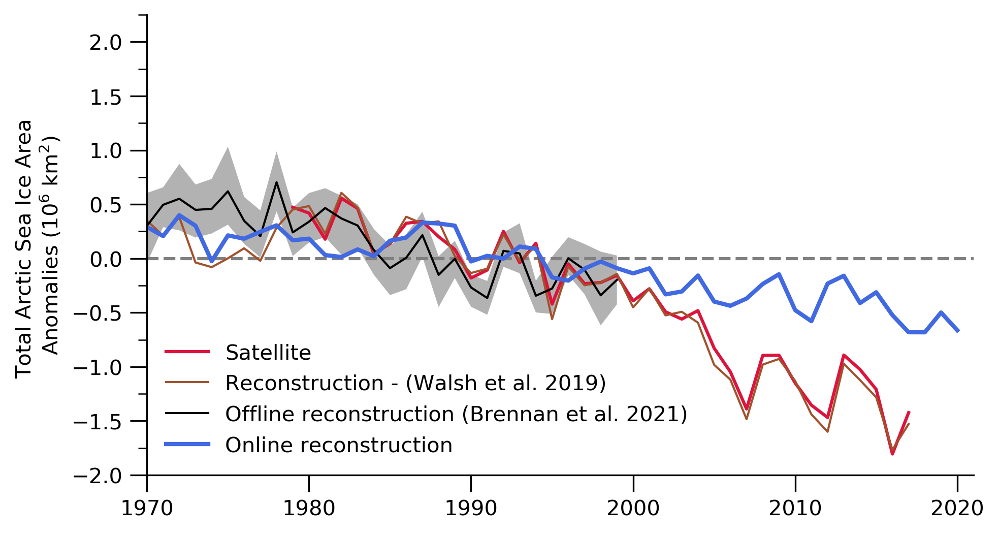

In [182]:
fig,ax = plt.subplots(1,figsize=(7,4))
plt.axhline(0,linestyle='--',color='gray')

plt.plot(fet_time,fet_sia_anom_adj, color='crimson', label='Satellite')

plt.plot(walsh_time,walsh_sia_anom,
         label='Reconstruction - (Walsh et al. 2019)', color='sienna',
         linewidth=1)
plt.plot(recon_years,sia_ensmn_anom_ccsm4,color='k',#'#8756e4',
         label='Offline reconstruction (Brennan et al. 2021)',linewidth=1)

plt.fill_between(recon_years,sia_ccsm4_2_5_anom,sia_ccsm4_97_5_anom,
                 alpha=0.3, color='k',linewidth=0.01)

plt.plot(np.arange(1851,2021,1),recon_sia_ensmn_anom, 
         color='royalblue', label='Online reconstruction', linewidth=2)

plt.legend(loc='lower left', frameon=False)
plt.ylabel('Total Arctic Sea Ice Area \nAnomalies (10$^6$ km$^2$)')

# plt.text(1930,2.0,('(Satellite, Recon): R$^2$ = '+str(np.round(corr_sat_recon_annual**2,2))+
#          ', CE = '+str(np.round(ce_sat_recon_annual,2))))
# plt.text(1930,1.75,('(Walsh, Recon):    R$^2$ = '+str(np.round(corr_walsh_recon_annual**2,2))+
#          ', CE = '+str(np.round(ce_walsh_recon_annual,2))))
# plt.text(1930,1.5,('(Brennan, Recon): R$^2$ = '+str(np.round(corr_Bren_recon_annual**2,2))+
#          ',  CE = '+str(np.round(ce_Bren_recon_annual,2))))

plt.xlim(1970,2021)
plt.ylim(-2,2.25)
#plt.title('Annual Comparison')

#plt.axvline(1917)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.yaxis.set_minor_locator(MultipleLocator(0.25))
ax.xaxis.set_minor_locator(MultipleLocator(10))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)

FileNotFoundError: [Errno 2] No such file or directory: 'figures/sia_recon_sat_comparison_heatmap.png'

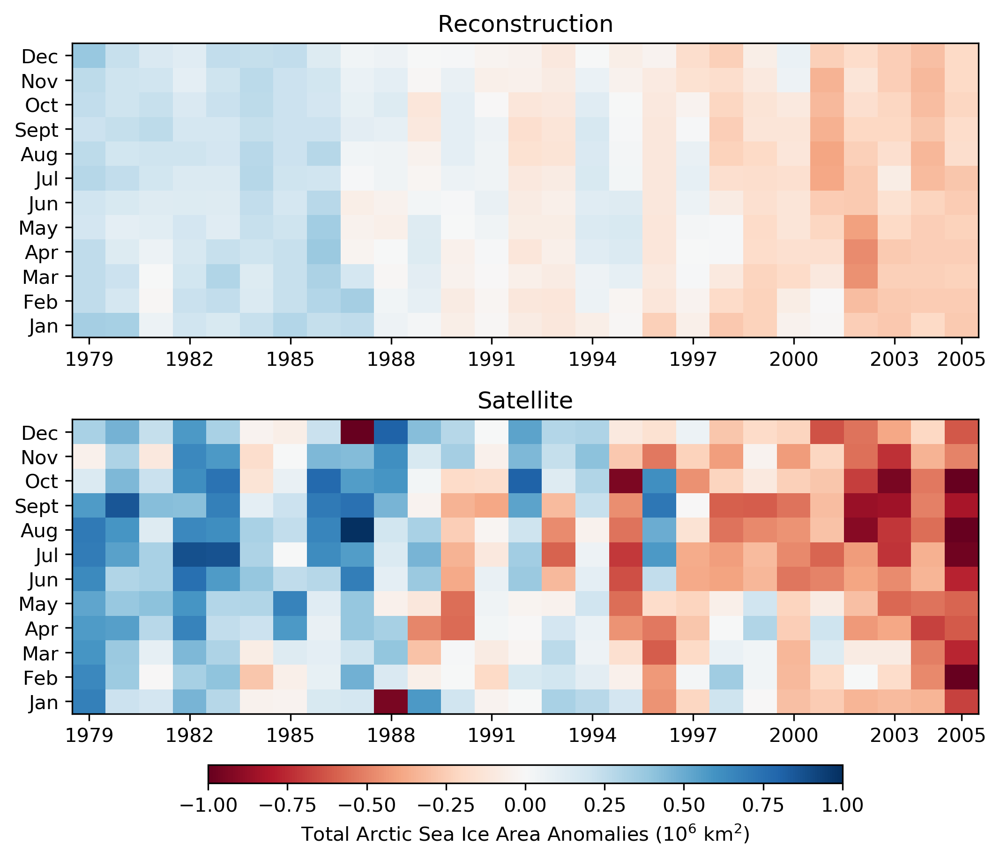

In [314]:
heat_ticks = [0.5,3.5,6.5,9.5,12.5,15.5,18.5,21.5,24.5,26.5]
heat_labels = [int(i) for i in (np.array(heat_ticks)+1978.5)]
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sept','Oct','Nov','Dec']

fig,axs = plt.subplots(2,1, figsize=(7,6),constrained_layout=True)
ax = axs.flatten()

cs1 = ax[0].pcolormesh(recon_sia_anom_comp.T*1e-6, cmap='RdBu',vmin=-1,vmax=1)
cs2 = ax[1].pcolormesh(sat_sia_mo_anom_comp.T, cmap='RdBu',vmin=-1,vmax=1)

plt.colorbar(cs2,ax=ax[1],orientation='horizontal', shrink=0.7,aspect=30,
             label='Total Arctic Sea Ice Area Anomalies (10$^6$ km$^2$)')

# plt.colorbar(cs1, ax=ax[0],label='Total Arctic Sea Ice Area \nAnomalies (10$^6$ km$^2$)')
# plt.colorbar(cb1, orientation='horizontal', shrink=0.8, ax=ax[6])

ax[0].set_xticklabels(heat_labels)
ax[0].set_xticks(heat_ticks)
ax[0].set_yticklabels(months)
ax[0].set_yticks(np.arange(0.5,12,1))
ax[1].set_xticklabels(heat_labels)
ax[1].set_xticks(heat_ticks)
ax[1].set_yticklabels(months)
ax[1].set_yticks(np.arange(0.5,12,1))

ax[0].set_title('Reconstruction')
ax[1].set_title('Satellite')

savename ='figures/sia_recon_sat_comparison_heatmap.png'
plt.savefig(savename)

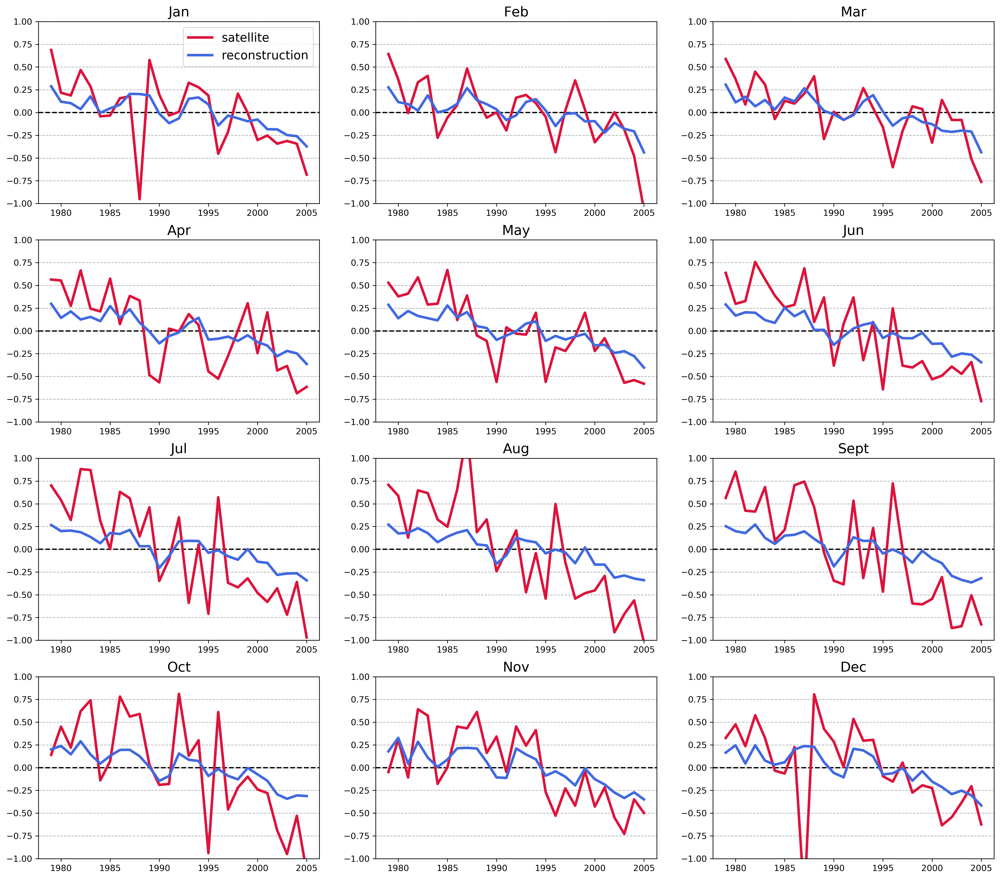

In [561]:
fig,axs = plt.subplots(4,3, figsize=(20,18))
ax=axs.flatten()

for i in range(12):
    ax[i].axhline(0, color='k',linestyle='--')
    ax[i].plot(sat_years_mo_comp,sat_sia_mo_anom_comp[:,i], label='satellite',
               color='crimson', linewidth=3)
    ax[i].plot(sat_years_mo_comp,recon_sia_anom_comp[:,i]*1e-6, label='reconstruction',
               color='royalblue', linewidth=3)
    ax[i].set_title(months[i], fontsize=16)
    ax[i].set_ylim(-1,1)
    
    ax[i].grid(linestyle='--',axis='y')
    
ax[0].legend(fontsize=14)

(1850, 2020)

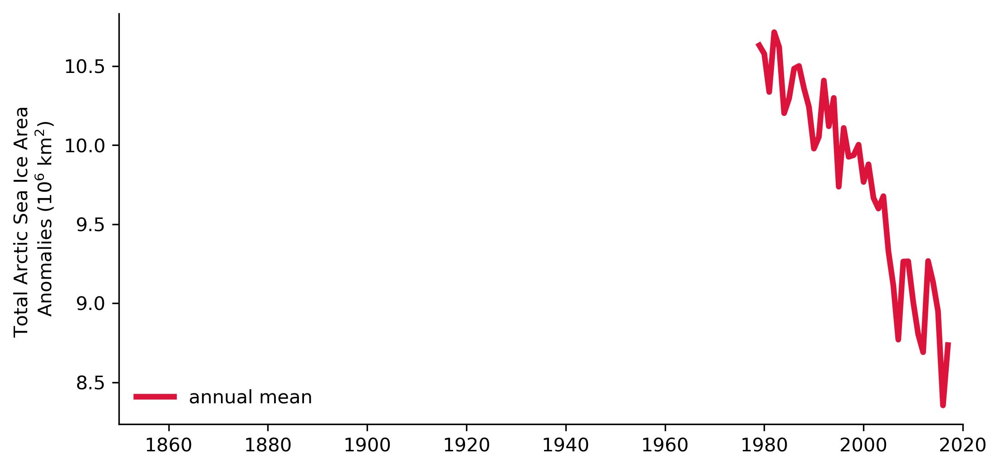

In [721]:
fig,ax = plt.subplots(1,1, figsize=(8,4))

plt.plot(fet_time,np.nanmean(sat_sia_mo,axis=1), color='crimson', label='annual mean', linewidth=3)

plt.legend(loc='lower left', frameon=False)
plt.ylabel('Total Arctic Sea Ice Area \nAnomalies (10$^6$ km$^2$)')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# plt.text(1855,-1.6,('R$^2$ = '+str(np.round(corr_sat_recon_annual**2,2))+
#          ', CE = '+str(np.round(ce_sat_recon_annual,2))))

plt.xlim(1850,2020)

In [672]:
cmap = plt.cm.get_cmap('Reds')
blah = np.arange(0.2,1,0.8/12)
red_colors = [cmap(i) for i in blah]

(0, 15)

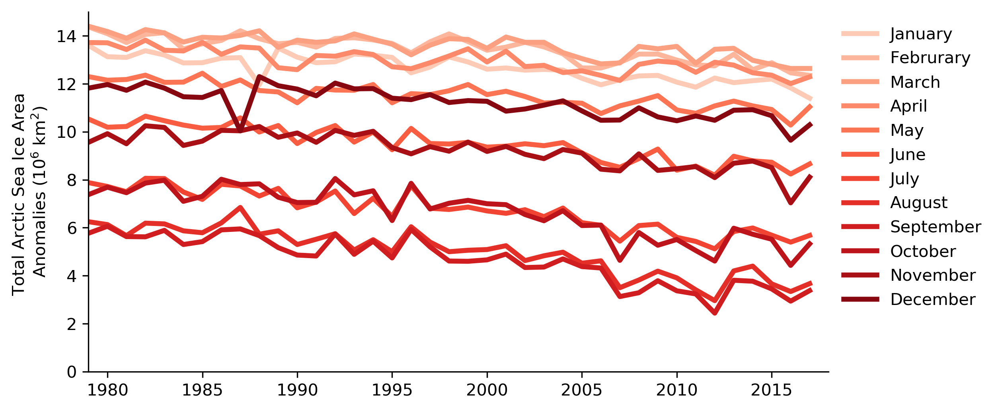

In [676]:
fig,ax = plt.subplots(1,1, figsize=(8,4))

for i in range(12):
    plt.plot(fet_time,sat_sia_mo[:,i], color=red_colors[i], label=month_names[i], linewidth=3)

plt.legend(bbox_to_anchor=[1,1], frameon=False)
plt.ylabel('Total Arctic Sea Ice Area \nAnomalies (10$^6$ km$^2$)')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# plt.text(1855,-1.6,('R$^2$ = '+str(np.round(corr_sat_recon_annual**2,2))+
#          ', CE = '+str(np.round(ce_sat_recon_annual,2))))

plt.xlim(1979,2018)
plt.ylim(0,15)

In [686]:
cmap = plt.cm.get_cmap('Reds')
blah = np.arange(0.2,1,0.8/39)
red_colors = [cmap(i) for i in blah]

In [711]:
fet_time

array([1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989,
       1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000,
       2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011,
       2012, 2013, 2014, 2015, 2016, 2017])

(2, 15)

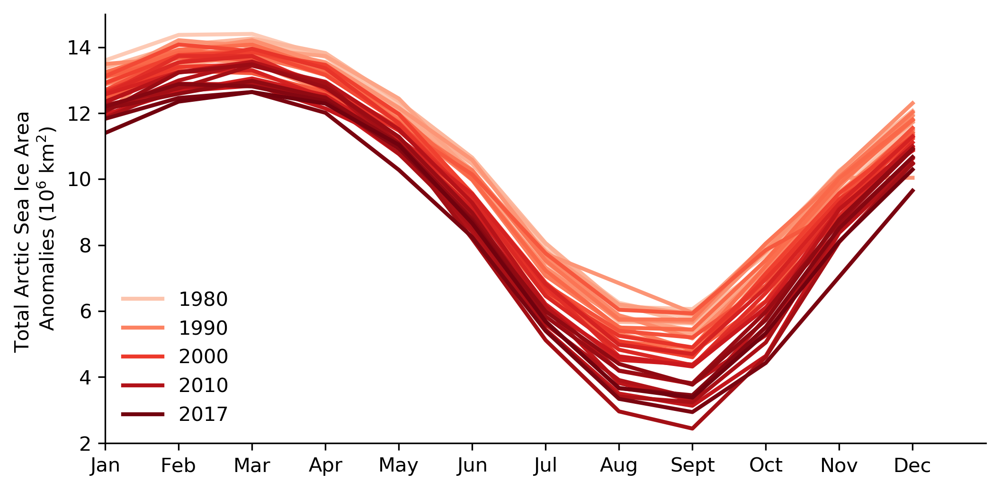

In [720]:
fig,ax = plt.subplots(1,1, figsize=(8,4))

for i in range(39):
    if fet_time[i]>2016: 
        plt.plot(sat_sia_mo[i,:], color=red_colors[i], linewidth=2,label = str(fet_time[i]))
    elif fet_time[i]%10>0:
        plt.plot(sat_sia_mo[i,:], color=red_colors[i], linewidth=2)
    else: 
        plt.plot(sat_sia_mo[i,:], color=red_colors[i], linewidth=2,label = str(fet_time[i]))

plt.legend(loc='lower left', frameon=False)
plt.ylabel('Total Arctic Sea Ice Area \nAnomalies (10$^6$ km$^2$)')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# plt.text(1855,-1.6,('R$^2$ = '+str(np.round(corr_sat_recon_annual**2,2))+
#          ', CE = '+str(np.round(ce_sat_recon_annual,2))))

plt.xlim(0,12)
plt.xticks(np.arange(0,12,1),months)
plt.ylim(2,15)

(2, 15)

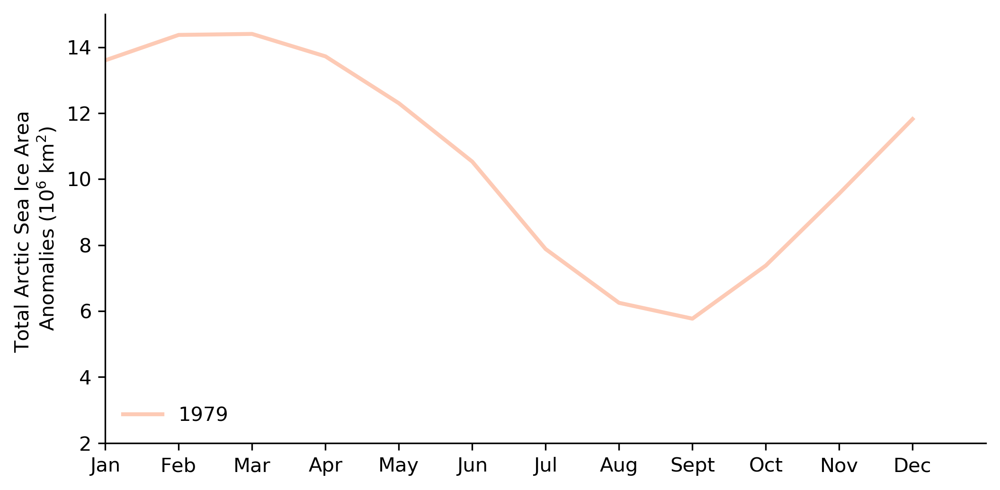

In [719]:
fig,ax = plt.subplots(1,1, figsize=(8,4))
i=0
plt.plot(sat_sia_mo[i,:], color=red_colors[i], linewidth=2,label = str(fet_time[i]))

plt.legend(loc='lower left', frameon=False)
plt.ylabel('Total Arctic Sea Ice Area \nAnomalies (10$^6$ km$^2$)')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# plt.text(1855,-1.6,('R$^2$ = '+str(np.round(corr_sat_recon_annual**2,2))+
#          ', CE = '+str(np.round(ce_sat_recon_annual,2))))

plt.xlim(0,12)
plt.xticks(np.arange(0,12,1),months)
plt.ylim(2,15)

## Full field: Spatial skill: 

In [91]:
corr_all = {}
ce_all = {}

for var in limvars: 
    corr_var = np.zeros((Xa_dcomp_all[var].shape[0]))
    ce_var = np.zeros((Xa_dcomp_all[var].shape[0]))

    for i in range(Xa_dcomp_all[var].shape[0]):
        corr_var[i] = np.corrcoef(X_var_all[var][i,:],Xa_dcomp_all[var][i,:])[0,1]
        ce_var[i] = oda.coefficient_efficiency(X_var_all[var][i,:],Xa_dcomp_all[var][i,:])

    corr_var_2d = np.reshape(corr_var,(LIMd['var_dict'][var]['lat'].shape[0],LIMd['var_dict'][var]['lon'].shape[0]))
    ce_var_2d = np.reshape(ce_var,(LIMd['var_dict'][var]['lat'].shape[0],LIMd['var_dict'][var]['lon'].shape[0]))
    
    corr_all[var] = corr_var_2d
    ce_all[var] = ce_var_2d

../Online_DA_utils.py:98: RuntimeWarning: Mean of empty slice
  denom = np.nansum(np.power(ref-np.nanmean(ref,axis=0),2),axis=0)
../Online_DA_utils.py:99: RuntimeWarning: invalid value encountered in true_divide
  CE    = 1. - np.divide(numer,denom)
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/numpy/lib/function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
../Online_DA_utils.py:99: RuntimeWarning: divide by zero encountered in true_divide
  CE    = 1. - np.divide(numer,denom)


In [92]:
from cartopy.util import add_cyclic_point

/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/ipykernel_launcher.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/ipykernel_launcher.py:31: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/IPython/core/events.py:88: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  func(*args, **kwargs)


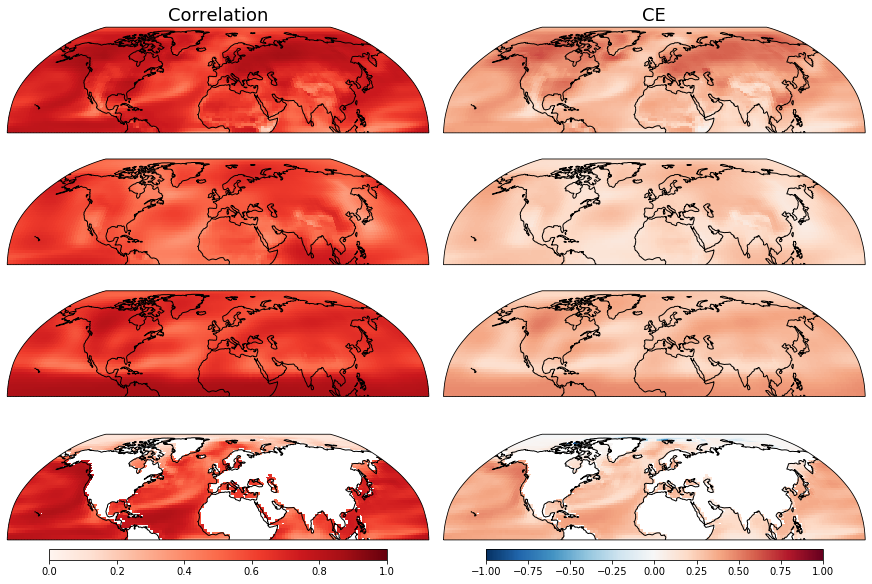

In [93]:
#fig = plt.figure(2, figsize=(14, 18))
fig,axs = plt.subplots(4,2, figsize=(12, 8), constrained_layout=True,
                       subplot_kw={'projection':ccrs.Robinson()})
ax = axs.flatten()
pltv = np.arange(0,8,2)

for v,var in enumerate(['tas','psl','zg','tos']): 
    lat = LIMd['var_dict'][var]['lat']
    lon = LIMd['var_dict'][var]['lon']
    
    wrap_corr, wrap_lon = add_cyclic_point(corr_all[var], coord=lon)
    wrap_ce, wrap_lon = add_cyclic_point(ce_all[var], coord=lon)
    
    i = pltv[v]
    ax[i].coastlines()
    cb1 = ax[i].pcolormesh(wrap_lon,lat,wrap_corr,
                           cmap='Reds',transform=ccrs.PlateCarree(),
                           vmin=0, vmax=1)

    ax[i+1].coastlines()
    cb2 = ax[i+1].pcolormesh(wrap_lon,lat,wrap_ce,
                             cmap='RdBu_r',transform=ccrs.PlateCarree(),
                             vmin=-1, vmax=1)

ax[0].set_title('Correlation', fontsize=18)
ax[1].set_title('CE', fontsize=18)

plt.colorbar(cb1, orientation='horizontal', shrink=0.8, ax=ax[6])
plt.colorbar(cb2, orientation='horizontal', shrink=0.8, ax=ax[7])

plt.tight_layout()

/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/ipykernel_launcher.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/ipykernel_launcher.py:51: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/IPython/core/events.py:88: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  func(*args, **kwargs)


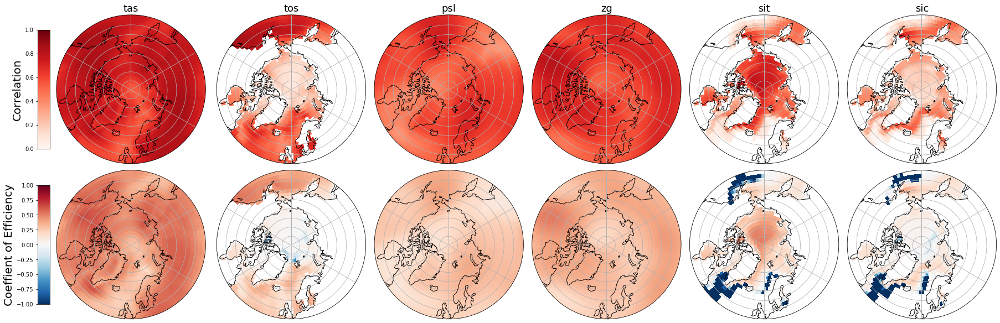

In [94]:
#fig = plt.figure(2, figsize=(14, 18))
fig,axs = plt.subplots(2,6, figsize=(25,8),constrained_layout=True,
                       subplot_kw={'projection':ccrs.NorthPolarStereo()})
ax = axs.flatten()
pltv = np.arange(6,12,1)

for v,var in enumerate(limvars):
    lat = LIMd['var_dict'][var]['lat']
    lon = LIMd['var_dict'][var]['lon']
    
    wrap_corr, wrap_lon = add_cyclic_point(corr_all[var], coord=lon)
    wrap_ce, wrap_lon = add_cyclic_point(ce_all[var], coord=lon)
    
    ax[v].coastlines()
    ax[v].gridlines()
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax[v].set_boundary(circle, transform=ax[v].transAxes)
    ax[v].set_extent([-180, 180, 90, 50], crs=ccrs.PlateCarree())
    cb1 = ax[v].pcolormesh(wrap_lon,lat,wrap_corr,
                           cmap='Reds',transform=ccrs.PlateCarree(),
                           vmin=0, vmax=1)
    i = pltv[v]
    ax[i].coastlines()
    ax[i].gridlines()
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax[i].set_boundary(circle, transform=ax[i].transAxes)
    ax[i].set_extent([-180, 180, 90, 50], crs=ccrs.PlateCarree())
    cb2 = ax[i].pcolormesh(wrap_lon,lat,wrap_ce,
                           cmap='RdBu_r',transform=ccrs.PlateCarree(),
                           vmin=-1, vmax=1)
    
    ax[v].set_title(var, fontsize=18)


colb1 = fig.colorbar(cb1, location='left',shrink=0.8, ax=ax[0],aspect=30)
colb2 = plt.colorbar(cb2, location='left',shrink=0.8, ax=ax[6],aspect=30)

colb1.set_label(label='Correlation', size=20)
colb2.set_label(label='Coeffient of Efficiency', size=20)

plt.tight_layout()

/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/IPython/core/events.py:88: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  func(*args, **kwargs)


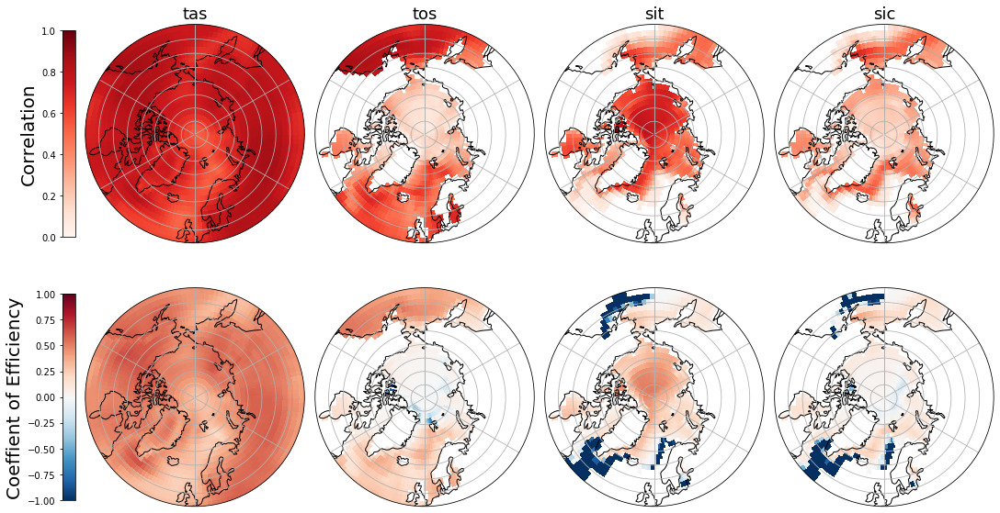

In [95]:
#fig = plt.figure(2, figsize=(14, 18))
fig,axs = plt.subplots(2,4, figsize=(15,8), constrained_layout=True,
                       subplot_kw={'projection':ccrs.NorthPolarStereo()})
ax = axs.flatten()
pltv = np.arange(4,8,1)

for v,var in enumerate(['tas','tos','sit','sic']):
    lat = LIMd['var_dict'][var]['lat']
    lon = LIMd['var_dict'][var]['lon']
    
    wrap_corr, wrap_lon = add_cyclic_point(corr_all[var], coord=lon)
    wrap_ce, wrap_lon = add_cyclic_point(ce_all[var], coord=lon)
    
    ax[v].coastlines()
    ax[v].gridlines()
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax[v].set_boundary(circle, transform=ax[v].transAxes)
    ax[v].set_extent([-180, 180, 90, 50], crs=ccrs.PlateCarree())
    cb1 = ax[v].pcolormesh(wrap_lon,lat,wrap_corr,
                           cmap='Reds',transform=ccrs.PlateCarree(),
                           vmin=0, vmax=1)
    i = pltv[v]
    ax[i].coastlines()
    ax[i].gridlines()
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax[i].set_boundary(circle, transform=ax[i].transAxes)
    ax[i].set_extent([-180, 180, 90, 50], crs=ccrs.PlateCarree())
    cb2 = ax[i].pcolormesh(wrap_lon,lat,wrap_ce,
                           cmap='RdBu_r',transform=ccrs.PlateCarree(),
                           vmin=-1, vmax=1)
    
    ax[v].set_title(var, fontsize=18)


ax[0].set_ylabel('Correlation', fontsize=18)
# ax[1].set_title('CE', fontsize=18)

colb1 = fig.colorbar(cb1, location='left',shrink=0.8, ax=ax[0],aspect=30)
colb2 = plt.colorbar(cb2, location='left',shrink=0.8, ax=ax[4],aspect=30)

colb1.set_label(label='Correlation', size=20)
colb2.set_label(label='Coeffient of Efficiency', size=20)
#plt.tight_layout()

In [96]:
time

array([datetime.datetime(1850, 1, 15, 0, 0),
       datetime.datetime(1850, 2, 15, 0, 0),
       datetime.datetime(1850, 3, 15, 0, 0), ...,
       datetime.datetime(2004, 10, 15, 0, 0),
       datetime.datetime(2004, 11, 15, 0, 0),
       datetime.datetime(2004, 12, 15, 0, 0)], dtype=object)